Homework 4 — (15 points)
======
### What to hand in
You are to submit the following things for this homework:
1. A Jupyter notebook containing all code and output (figures and audio). I should be able to evaluate the file to reproduce all output. 
1. Any other data that we tell you to save to a file (e.g. audio files).

Note: Make sure to include all the files that are required for the notebook to run **from the submission folder** (e.g. police_noisy.wav). Points will be taken off from submissions that crash because Python cannot find the specified files.

### How to hand it in
To submit your lab:
1. Compress all of the files specified into a .zip file. 
1. Name the file in the following manner, firstname_lastname_hw1.zip. For example, Bryan_Pardo_hw1.zip. 
1. Submit this .zip file via Canvas

### Run this code block 1st, to import the needed packages

In [1]:
# This line is a convenience to import most packages you'll need. You may need to import others (eg random and cmath)
import IPython, numpy as np, scipy as sp, matplotlib.pyplot as plt, matplotlib, sklearn, librosa, cmath,math
from IPython.display import Audio
 
# This line makes sure your plots happen IN the webpage you're building, instead of in separate windows.
%matplotlib inline

/Users/olivergoodman/miniconda2/envs/eecs352/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


### Some useful code

####  STFT 

In [2]:
from scipy.fftpack import fft
from scipy.signal import hann

def stft(signal, window_size, hop_size, window_type = 'hann'):
    """
    Computes the short term fourier transform of a 1-D numpy array, where the array 
    is windowed into a set of subarrays, each of length window_size. The distance between
    window centers (in samples) is given by hop_size. The type of window applied is
    determined by window_type. This returns a 2-D numpy array where the ith column
    is the FFT of the ith window. Each column contains an array of complex values.
    
    Input Parameters
    ----------------
    signal: The 1-d (complex or real) numpy array containing the signal
    window_size: an integer scalar specifying the number of samples in a window
    hop_size: an integer specifying the number of samples between the start of adjacent windows
    window_type: a string specifying one of two "hann" or "rectangular"
    
    Returns
    -------
    a 2D numpy array of complex numbers where the array column is the FFT of the ith window,
    and the jth element in the ith column is the jth frequency of analysis.
    """
    
    # figure out how many hops
    length_to_cover_with_hops = len(signal) - window_size;
    assert (length_to_cover_with_hops >= 0), "window_size cannot be longer than the signal to be windowed"
    num_hops = 1 + length_to_cover_with_hops/hop_size;
    
    # make our window function
    if (window_type == 'hann'):
        window = sp.signal.hann(window_size, sym=False)
    else:
        window = np.ones(window_size)
    
    stft = [0]*num_hops
    # fill the array with values 
    for hop in range(num_hops):
        start = hop*hop_size
        end = start + window_size
        unwindowed_sound = signal[start:end]
        windowed_sound =  unwindowed_sound * window
        stft[hop]= fft(windowed_sound, window_size) 
    return np.array(stft).T

#### ISTFT

In [3]:
from scipy.fftpack import ifft

def istft(X, hop_size):
    """
    Takes a 2-D numpy array representing an STFT of some signal, where stft[i,j] is the jth
    frequency of analysis in the FFT of the ith window. 
    Performs an inverse FFT on each window and then does overlap & add resynthesis to rebuild 
    the original signal the STFT was built from.
    
    Input Parameters
    ----------------
    X: a 2-D numpy array of complex numbers representing an STFT, where the ith 
    column is the FFT of the ith window, and the jth row is the jth frequency of analysis.
        
    hop_size: an integer specifying the number of samples between the start of adjacent windows.
        
    Returns
    -------
    a 1-d numpy array of (possibly complex) values representing the original signal used to make X
    """
    
    # make an empty signal of the appropriate length
    window_size,num_hops = X.shape
    signal_length = (num_hops-1)*hop_size + window_size 
    signal = np.zeros(signal_length,dtype='complex');
    
    #fill the signal
    for n in range(num_hops):
        start = n * hop_size
        end = start + window_size
        signal[start:end] = signal[start:end] + ifft(X[:,n])
    return signal

#### Spectrogram (plotting function with zooming options)

In [4]:
def plt_spectrogram(X,win_length, hop_size, sample_rate, zoom_x=None, zoom_y=None,tick_labels='time-freq'):
    """
    Plots the log magnitude spectrogram.
    
    Input Parameters:
    ------------------
    X: 2D complex numpy array containing the stft values. Rows correspond to frequency bins and columns to time frames.
    win_length: the length of the analysis window
    hop_size: the hop size between adjacent windows
    sample_rate: sampling frequency
    tick_labels: the type of x and y tick labels, there are two options:
                 'time-freq': shows times (sec) on the x-axis and frequency (Hz) on the y-axis (default)
                 'bin-frame': shows time frame numbers on the x-axis and frequency bin numbers on the y-axis
                
    zoom_x: 1 by 2 numpy array containing the range of values on the x-axis, e.g. zoom_t=np.array([x_start,x_end])
    zoom_y: 1 by 2 numpy array containing the range of values on the y-axis, e.g. zoom_f=np.array([y_start,y_end])
    
    
    Returns:
    ---------
    times: 1D real numpy array containing time instances corresponding to stft frames
    freqs: 1D real numpy array containing frequencies of analyasis up to Nyquist rate
    2D plot of the magnitude spectrogram
    """
    
    # Find the size of stft
    Nf,Nt=np.shape(X)
    
    # Compute the log magnitude spectrogram
    X=20*np.log10(np.abs(X))
    
    # Extract the first half of the spectrum for each time frame
    X=X[0:Nf/2]
    
    # Now that we've removed frequencies above Nyquist, keep track of the new number of frequencies
    Nf=np.shape(X)[0]
        
    # Generate a vector of values, showing the time of the middle of each window (used for plotting)
    times=(hop_size/float(sample_rate))*np.arange(Nt)
    
    # Generate a vector containing the set of fequencies of analysis of our FFT for plotting
    freqs=(float(sample_rate)/win_length)*np.arange(Nf)
    
    # Generate time and frequency matrices for pcolormesh
    times_matrix,freqs_matrix=np.meshgrid(times,freqs)
    
    # Plot the log magnitude spectrogram
    plt.title('Log magnitude spectrogram')
    if tick_labels == 'bin-frame':
        plt.pcolormesh(X)
        plt.xlabel('Time-frame Number')
        plt.ylabel('Frequency-bin Number')
    else:
        plt.pcolormesh(times_matrix,freqs_matrix,X)
        plt.xlabel('Time (sec)')
        plt.ylabel('Frequency (Hz)')

        
    # Zoom in on the plot if specified
    if zoom_x is None and zoom_y is None:
        plt.axis('tight')
        
    if zoom_x is not None:
        plt.xlim(zoom_x)
        
    if zoom_y is not None:
        plt.ylim(zoom_y)
        
    return X, times, freqs

### Time-Frequency Masking

#### 1. (0.5 points) Load *police_noisy.wav*. The audio contains a ringing noise somewhere. Calculate the STFT of the audio signal and the magnitude spectrogram respectively denoted by *X* and *V*, using a hann window of length 2048 and 50% overlap between adjacent windows. Keep in mind that the magnitude spectrogram includes only the first half of the spectrum for each time frame. Use the function *plt_spectrogram* provided above to plot the *log magnitude spectrogram* of the audio signal. Identify the region of the ringing noise. It should be a square of about 30 frequency bins by 30 time frames. Write down the frequency and time indices in your report. 

#### * Note: we need to find the coordinates of the noisy region in terms of frequency bin number and time frame number, not in Hz and seconds. You can use the tick_labels parameter to set the values on the x-axis and y-axis to the required units. Moreover, zoom-x and zoom-y parameters can be set to narrower ranges in order to give better estimates of the region boundaries. Be careful about the consistency of zoom-x and zoom-y units with tick-labels.*

Frequency-bin indices: 385 to 416

Time frame indices: 384 to 414

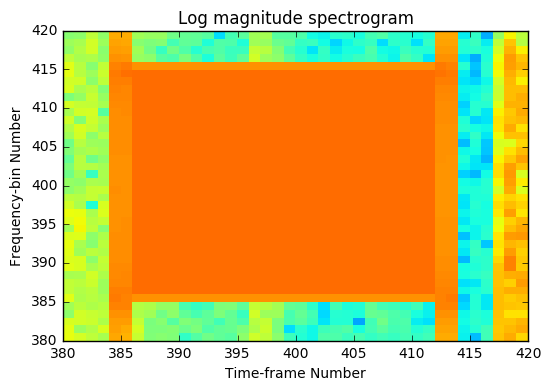

In [5]:
police_noisy, sr = librosa.load('police_noisy.wav', 44100)
win_len = 2048
x = stft(police_noisy, win_len, win_len/2)

z_x = np.array([380, 420])
z_y = np.array([380, 420])
original_spectrogram, times, freqs = plt_spectrogram(x, win_len, win_len/2, sr, zoom_x=z_x, zoom_y=z_y, tick_labels='bin-frame')

Audio(police_noisy, rate=sr)

#### 2. (0.5 points) Use the frequency and time indices you found in Question 1 to create a simple binary time-frequency mask to remove the region of the ringing noise. The binary mask, *M*, should be of the same size as the magnitude spectrogram *V* (covering only half of the STFT output). Derive a full (two-sided) time-frequency mask, *M_full*, from *M* and apply it to the STFT of the noisy audio. Compute the denoised signal by tranforming the masked STFT, *X_masked*, back to the time domain. Plot the magnitude spectrogram of the denoised audio and check that the region of the ringing noise has been removed. 



/Users/olivergoodman/miniconda2/envs/eecs352/lib/python2.7/site-packages/IPython/lib/display.py:123: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


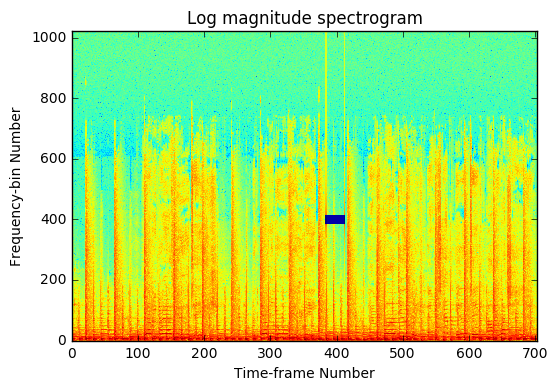

In [6]:
mask = np.ones(shape=(x.shape[0]/2, x.shape[1]))
mask[385:416, 384:414] = 0.0000001
mask_flip = np.flipud(mask)

binary_mask = np.vstack((mask, mask_flip))

x_masked = x * binary_mask
new_signal = istft(x_masked, win_len/2)

masked_spectrogram, times, freqs = plt_spectrogram(x_masked, win_len, win_len/2, sr, tick_labels='bin-frame')

Audio(new_signal, rate=sr)

#### 3. (0.5 points) Explain why the time-frequecy mask cannot be applied to the magnitude spectrogram to extract the noise. Why do we need to derive a *full* time-frequency mask to make a version of police_noisy.wav that doesn't have the ringing? 

We need to dreive a full time-frequency mask because the log-magnitude spectrogram only looks at frequencies below the nyquist rate. As a result, its vertical dimension is half of that of the stft of the signal. By creating a mask that also includes the complex values, we are able to multiply the mask element wise with the stft to zero out the ringing noise. 

### Beat Spectrum

#### 4. (1 point) We have provided an implementation of the autocorrelation function. Note that we normalize by the number of nonzero additions. Explain the effect this has (compared to the standard autocorrelation in numpy) and tell us why you think we did this.  Hint: What are we using the autocorreation function for in REPET? How does normalizing affect that?

In [7]:
def acorr(x):
    """
    Takes a 1D numpy array and returns the autocorrelation. 
    
    Input Parameter:
    ----------------
    x: 1D numpy array of length Lx
    
    Ouput Parameter:
    ----------------
    x_acorr: 1D numpy array of length x_len containing the values of the autocorrelation function of x
    
    Note: the actual length of autocorrelation function is (2*x_len)-1, but since this function is symmetric
          we can cut off (x_len)-1 samples and return one side of length x_len without losing information. 
    """
    
    x_len=np.size(x)
    x_pad=np.concatenate([x,np.zeros(x_len-1)])
    x_acorr=ifft(np.abs(fft(x_pad))**2).real
    x_acorr=x_acorr[0:x_len]
    
    x_acorr=x_acorr/(np.arange(x_len)[::-1]+1)  # normalize by the number of nonzero additions
            
    return x_acorr

# Test case: 
# Note: the numpy correlate function is not normalized so the results seem different. If you comment out the 
#       normalization line above the outputs will be the same.
test_array=np.arange(10)
print 'Output of the accor function:  '+ str(acorr(test_array))
print 'Output of the correlate function:  '+str(np.correlate(test_array,test_array,"full")[len(test_array)-1:2*len(test_array)])


Output of the accor function:  [  2.85000000e+01   2.66666667e+01   2.45000000e+01   2.20000000e+01
   1.91666667e+01   1.60000000e+01   1.25000000e+01   8.66666667e+00
   4.50000000e+00   7.38824206e-14]
Output of the correlate function:  [285 240 196 154 115  80  50  26   9   0]


Normalizing by the number of nonzero additions in the autocorrelation helps ignore any bias based on how much of the signal is overlapping with itself during the autocorrelation. Standard autocorrelation gives values that do not take this into consideration, so it would be biased towards cases where the signal is completely overlapping with itself (when time lag is zero). We do this normalization based on the number of nonzero additions to ensure this doesn't happen. 

#### 5. (1 points) Implement the beat spectrum. Use the autocorrelation function from Question 4. Do not square the magnitude spectrogram within your function; it will be squared outside the function, in the *repet* function. 

In [8]:
def beat_spectrum(S):
    """
    Computes the beat spectrum of a music mixture by applying the autocorrelation to all frequency channels (rows)
    of the spectrogram and taking the average. Note that the assumption is that the mixture is composed of a repeating
    background and a non-repeating foreground. Therefore, the spikes in the beat spectrum represent the repetitive 
    events in the spectrogram.  This function must PLOT the beat spectrum for viewing, since you'll be looking at the
    resulting plot to pick the repeating period used by REPET. 
    
    Input Parameter:
    ----------------
    S: 2D numpy array containing the spectrogram of a signal
    
    Output Parameter:
    ------------------
    beat_spec: 1D numpy array containing the beat spectrum 
    
    """
    
    acorrs = np.ndarray(shape=S.shape)
    
    for i, row in enumerate(S):
        acorrs[i] = acorr(row)
    
    beat_spectrum = np.average(acorrs, axis=0)
    
    plt.figure()
    plt.title('Beat Spectrum')
    plt.plot(beat_spectrum)
    plt.xlabel('Time Lag')
    
    return beat_spectrum
    


#### 6. (1 point) Apply the function to the spectrogram of the noisy (*police_noisy.wav*) as well as the denoised signals (the same signal after you removed the ringing). Plot both beat spectra. Do you observe any noticeable difference between the plots? What information does the beat spectrum provide regarding the ringing noise?

After comparing the beat spectrum of the original recording (the first figure) with the beat spectrum of the masked recording (second figure), both of the plots look fairly identical to one another. The beat spectrum thus provides us with the information that the ringing noise is not a repetitive sound in the recording, and thus can be isolated using REPET!

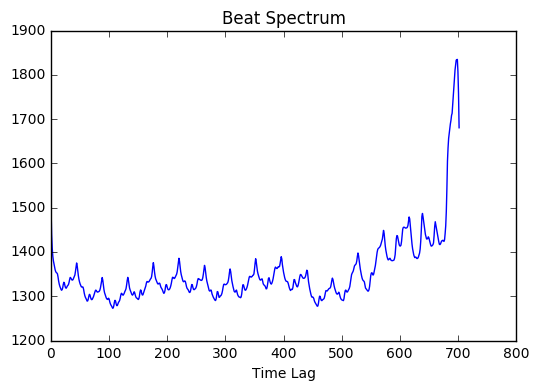

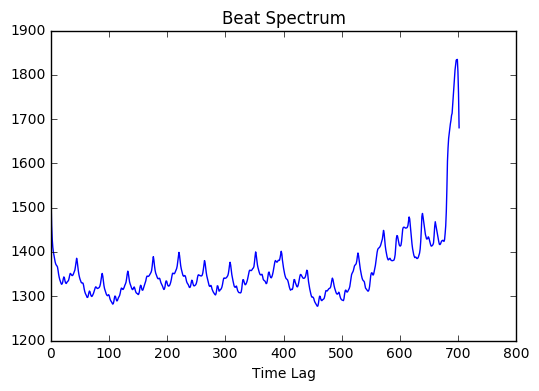

In [9]:
beats = beat_spectrum(original_spectrogram)

beats = beat_spectrum(masked_spectrogram)

#### 7. (0.5 points) Explain how you would find the period of the repeating structure from the beat spectrum. Remember that the repeating period does not necessarily correspond to the first highest peak. Remember also that the beat spectrum goes from lag 0 to lag n-1, where n is the length of the input signal.

To find the period of the repeating structure from the beat spectrum you first need to find all the periods. Ignoring the period at time lag 0 (because that would just be the signal overlapped with itself), we look for the longest strong repeating patter in x, which would be represented by the peaks in the beat spectrum with the largest level and repeating at the longest period in the beat spectrum. 

### REPET Algorithm

#### 8. (2 point) Implement a repeating-segment modeling function (Hint: use the numpy *median* function). Note that after segmentation of the spectrogram, the last segment is generally shorter (in time frames) than the other segments, because the number of time frames is not necessarily an integer multiple of the repeating period; Think about how you would handle that.

In [10]:
def repeating_segment(V,p):
    """
    Computes the repeating-segment model using the period obtained from the beat spectrum. 
    The repeating segment is that median background we'll be using to compare to the spectrum. 
    Its time duration will be the length of one period that you learned from the beat spectrum. 
    
    Input Parameters:
    -----------------
    V: 2D numpy array containing the magnitude spectrogram of the mixture
    p: scalar, repeating period (in number of samples) found from the beat spectrum 
    
    Output Parameter:
    S: 2D numpy array containing the repeating segment 
    """  
    
    num_freqs = V.shape[0]
    num_time = V.shape[1]
    
    # adding NANs to the last (shorter) period
    last_seg = V[0:num_freqs, num_time-(num_time%p):]
    last_seg_add_nan = np.empty(shape=(num_freqs, p-(num_time%p)))
    last_seg_add_nan[:] = np.NAN
    ls = np.append(last_seg, last_seg_add_nan, axis=1)

    V = V[0:num_freqs, 0:num_time-(num_time%p)]
    
    # adding new last period to the spectrogram
    V = np.append(V, ls, axis=1)
     
    S = np.ndarray(shape=(num_freqs, p))
    num_periods = int(np.ceil(num_time / float(p)))

    segments = np.reshape(V.T, (num_periods, p, num_freqs))
    
    S = np.nanmedian(segments, 0)
    
    return S.T


In [11]:
S = repeating_segment(original_spectrogram, 10)

#### 9. (1 point) Implement a repeating spectrogram modeling function (Hint: use the min function). Again, the last segment in your spectrogram is generally shorter than the repeating segment model. 

In [12]:
def repeating_spectrogram(V,S):
    """
    Builds the repeating-spectrogram model using the repeating segment model computed in the 
    previous question. This is composed of multiple copies of the repeating segment, tiled 
    together in the time-dimension so that it is the exact same size as the input signal's 
    spectrogram.
    
    Input Parameters:
    -----------------
    V: 2D numpy array containing the magnitude spectrogram of the mixture
    S: 2D numpy array containing the repeating segment model 
    
    Output Parameter:
    ------------------
    W: 2D numpy array containing the repeating-spectrogram 
    """
    num_periods = np.ceil(float(V.shape[1])/S.shape[1])
    
    # get the repeating segments
    repeating_segs = np.repeat(S, num_periods, axis=1)
    
    # change it's size to be the same of the spectrogram
    resize = V.shape[1] - repeating_segs.shape[1]
    repeating_segs = repeating_segs[0:, 0:V.shape[1]]
    
    W = np.minimum(repeating_segs, V)
    
    return W
    

In [13]:
repeating_spectro = repeating_spectrogram(original_spectrogram, S)

#### 10. (1 point) Implement a repeating-mask modeling function (Hint: use a division). Note that there could be zero values in your spectrogram. Think about how to handle that. 

In [14]:
def repeating_mask(V,W):
    """
    Before we do our separation, we need to compare our repeating_spectrogram to the original spectrogram of the signal
    to determine how to assign the energy in each time-frequency point (each element in your matrix). This function
    does that and makes a mask that will be applied to the spectrum. Note that unlike the denoising case in the first 
    question, here we are computing a "soft mask" with values ranging between 0 and 1.
    
    Input Parameters:
    -----------------
    V: numpy 2D array containing the magnitude spectrogram 
    W: numpy 2D array containing the repeating spectrogram
    
    Output Parameter:
    M: numpy 2D array containing the repeating mask 
    """
    # your code goes here
    V = V + 0.0000000001
    W = W + 0.0000000001    
    
    return np.divide(np.absolute(W), np.absolute(V))

In [15]:
M = repeating_mask(original_spectrogram, repeating_spectro)

### Music-voice Separation

#### 11.  (2 points) The function provided below runs the REPET algorithm using functions you wrote in previous questions. REPET builds a soft time-frequency mask (with values between 0 and 1), but we can also derive a binary time-frequency mask from it (with values of only 0s and 1s). To do so, we simply use a threshold value between 0 and 1 in the soft mask, so that values above the threshold will be forced to 1, while values below the threshold will be forced to 0. A binary mask can help to improve the perception of separation, but it will also increase the separation artifacts. 

#### Select the value of the repeating period in samples and the value of the masking threshold. Try different values of the masking threshold and compute the background and foreground audio estimates. Listen to the estimate and plot the magnitude spectrograms of the background and foreground estimates for each masking threshold you try. Write down the value of the masking threshold that gave you the best separation results.

#### Describe the separation results that you have obtained. Are the repeating musical background and the non-repeating vocal foreground well separated? Did you get any kind of audio artifacts? What did happen to the ringing noise? Why? 

In [26]:
def repet(file_path, rep_period, mask_thr):
    """
    Runs the REPET algorithm using functions implemented in qustions 3 through 8. NOTE: In the real REPET algorithm
    it also determines the repeating period from the beat spectrum by building a peak picker to find the best
    period from the beat spectrum. This seemed like too much for a homework, so we're making YOU the peak picker. 
    You'll have to run the beat_spectrum function before calling repet and input the value for rep_period.
    
    Input Parameters:
    ------------------
    file_path: string, path to the audio file to separate
    rep_period: scalar, repeating period in number of samples
    mask_thr: scalar, a value between 0 and 1 for thresholding the soft mask
    
    Plots:
    --------
    Separated background and foreground magnitude spectrogram plots 
    
    Returns: 
    ---------
    Separated background and foreground time signals
    """
    
    # Load the noisy mixture
    signal, sample_rate = librosa.load(file_path, 44100) 

    # Comput the stft of the audio signal 
    win_length_sec=0.04 # 40 msec window
    win_length_samp=int(2**np.ceil(np.log2(win_length_sec*sample_rate))) # next power2 of winow length in no. of samples
    n_fft=win_length_samp
    hop_size=win_length_samp/2 # 50% overlap
    win_type=sp.signal.hanning
    X = stft(signal, win_length_samp, hop_size, window_type = 'hann')

    # Compute the magnitude spectrogram (half spectrum)
    Vm = np.abs(X[0:win_length_samp/2+1,:])
    Nf,Nt=Vm.shape
    
    
    # Compute and plot the beat spectrum
    beat_spec = beat_spectrum(Vm**2)
    beat_spec = beat_spec/beat_spec[0] # normalization
    
    plt.figure()
    plt.plot(beat_spec)
    plt.grid('on')
    plt.axis('tight')
    plt.xlabel('Lag (sample number)')
    plt.title('Beat spectrum of the noisy mixture')
    
    ### REPET Algorithm ###
    
    # Compute the repeating soft mask
    Sm=repeating_segment(Vm,rep_period)
    Wm=repeating_spectrogram(Vm,Sm)
    soft_mask=repeating_mask(Vm,Wm)
        
    # Compute the repeating binary mask
    binary_mask=np.zeros(soft_mask.shape)
    binary_mask[soft_mask>=mask_thr]=1
    
    
    # Estimate the background and foreground via masking
    binary_mask=np.vstack([binary_mask,np.flipud(binary_mask[1:-1,:])])
    
    X_bg = binary_mask*X+1e-16  # background STFT
    signal_bg = np.real(istft(X_bg, hop_size)) # background time signal
    
    X_fg = (1-binary_mask)*X+1e-16  # foreground STFT
    signal_fg = np.real(istft(X_fg, hop_size)) # foreground time signal
            
    # Plot the log magnitude spectrograms and the binary mask
    plt.figure()    
    plt.subplot(211)
    plt_spectrogram(X,win_length_samp, hop_size, sample_rate,tick_labels='time-freq')
    plt.title('Mixture')
        
    plt.subplot(212)
    plt.pcolormesh(binary_mask[0:Nf,:])
    plt.xlabel('Time (sec)')
    plt.ylabel('Frequency (Hz)')
    plt.title('Binary mask')
    plt.axis('tight')
    
    plt.figure()
    plt.subplot(211)
    plt_spectrogram(X_bg,win_length_samp, hop_size, sample_rate,tick_labels='time-freq')
    plt.title('Background')
    
    plt.subplot(212)
    plt_spectrogram(X_fg,win_length_samp, hop_size, sample_rate,tick_labels='time-freq')
    plt.title('Foreground')
    
    return signal_bg,signal_fg

    

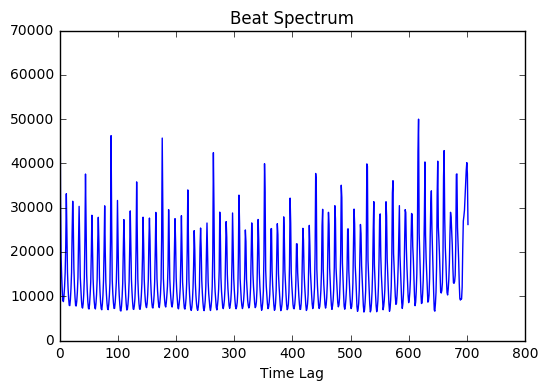

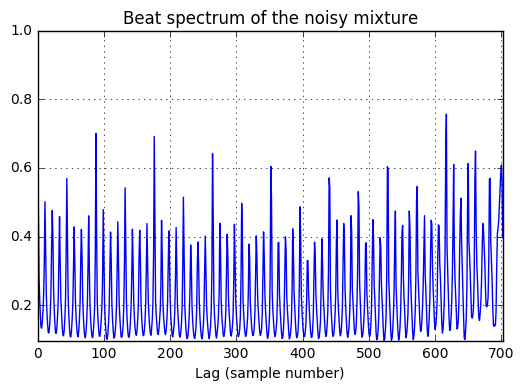

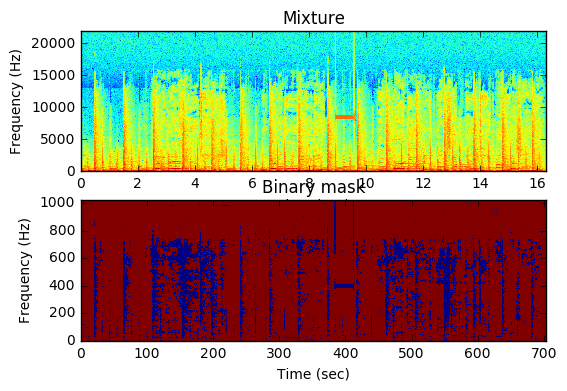

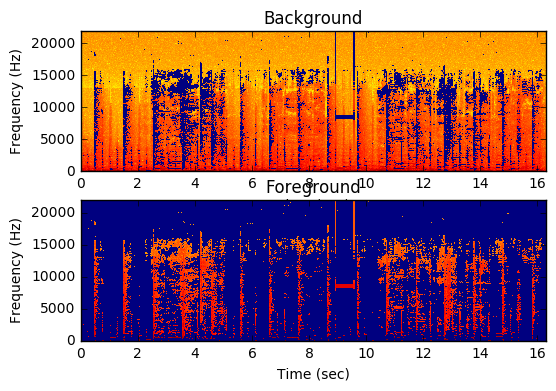

In [27]:
signal_bg, signal_fg = repet('police_noisy.wav', 85, .25)

Audio(signal_bg, rate=44100)

I used a period size of 85 and a threshold avlue of 0.25. 

The separation results are fairly clear, but not perfect.  The background signal obtained contains the repeating bass line and part of the drum and guitar lines (which are also repeating).  The foreground contains both Sting's vocal part, as well as part of the drum beats. Although theoretically the drum beat should not be present at all in the foreground, REPET seems to pick up parts of it. I experimented with different threshold values, but none were able to perfectly distinguish the vocal foreground from the musical background.  There were some bits of audio artifacts in the foreground, which sounded like tiny beeps and boops. I think these were caused by REPET not being able to perfectly separate background and foreground values around the threshold value, since some musical parts may have values that hover above and below the threshold. As a result, some sounds get separated, but not all of them. 

The ringing noise, however, was completely contained in the foreground. The reason for this is because it is not a repeating structure in the signal, so REPET was able to isolate it from the repeating beats in the background. 

### Source separation using NUSSL

NUSSL is an audio source separation python package developed by the [Interactive Audio Lab](http://music.eecs.northwestern.edu). In this part, you will use the NUSSL implementation of REPET and compare it to your implementation. You will also try an extended version of REPET, called REPET-SIM, and compare the performance of the two algorithms on an audio mixture of your choice. To install NUSSL, run the following command while your eecs352 environment is activated:
```
pip install nussl==0.1.5a10
```

More information on the installation and troubleshooting can be found [here](https://interactiveaudiolab.github.io/nussl/getting_started/install.html).


#### 12. (2 points) Go out on the web and find an example of music where REPET works well to separate out the voice and an example where it works poorly and do the following:
1. Crop each example to be between 10 and 30 seconds (pick a length appropriate for making your point)
1. Save each cropped example at the sample rate 22050 Hz
1. Make each example monophonic (i.e. one channel, not two)
1. Include both examples with your submission
1. Separate the sources using your implementation of REPET.  
1. Read the documentation on NUSSL implementation of REPET [here](https://interactiveaudiolab.github.io/nussl/src/repet.html), and use it to do source separation on the same mixture.
1. Compare the results of the previous two steps. For instance, play the separated sources or plot their log magnitude spectrograms. Do the results of the two implementations (yours and NUSSL's) match? 

The two signals that I chose were "Coastin'" by Zion I, and "The Girl From Impanema" by Stan Getz and Astrub Gilberto.  The former works better under REPET because it contains a repetitive background framework with singing over it. The former, however, is more difficult to separate into a clear foreground and background signal because it consists of a less even rhythm, and the singing and guitar also have similar sounds and blend in with one another in the recording. 

Comparing my implementation of REPET with the version found in the NUSSL package, I found that the NUSSL version was able to more clearly pick up on the background drum rhythm of "Coastin'", whereas my implementation focused more on capturing the repetitive piano part in the background. Both were able to remove the singing part fairly well in the background signal, however, they do contain some bits of audio artifacts. It appeared that the NUSSL version was able to reduce the number of audio artifacts in the separated signals, so both signals sounded clear and with more distinct sounds. Overall, however, the results between both NUSSL and my REPET were able to detect the singing part as the foreground song given that it was not clearly represent a reptitive structure.  

As far as "The Girl From Impanema", both NUSSL's REPET and my REPET struggled to separate the voice from the guitar into background and foreground signals.  However, the NUSSL's foreground signal did produce a slightly more clearer sounding version of the singing, however both versions of the alogrithm could not clearly distinguish a repeating part given the more complex background rhythm. 

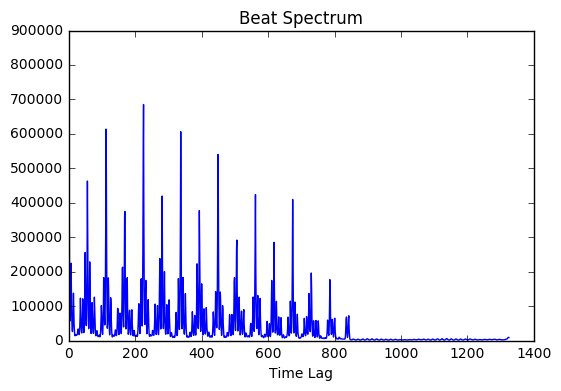

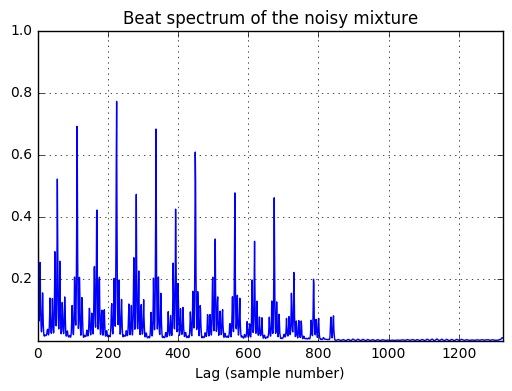

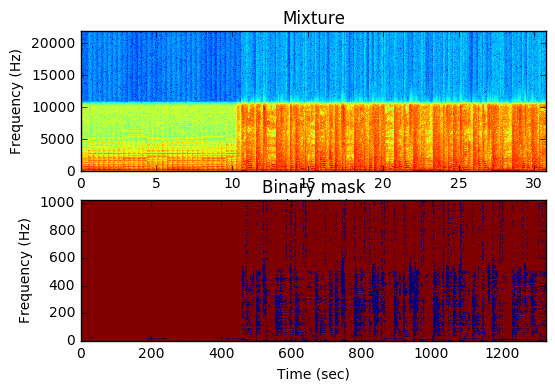

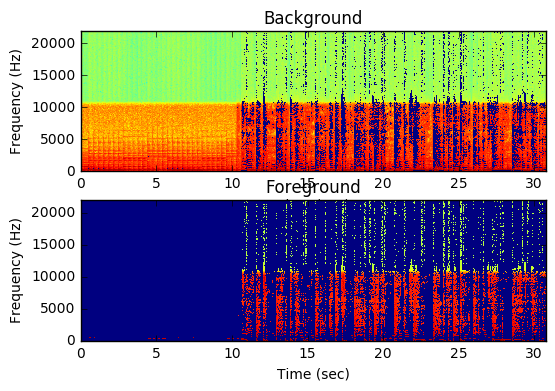

In [28]:
# "Coastin'" by Zion I: using my Repet (works well with REPET)
coastin_bg, coastin_fg = repet('coastin.wav', 25, .2)
Audio(coastin_bg, rate=44100)

/Users/olivergoodman/miniconda2/envs/eecs352/lib/python2.7/site-packages/ipykernel/__main__.py:30: RuntimeWarning: divide by zero encountered in log10


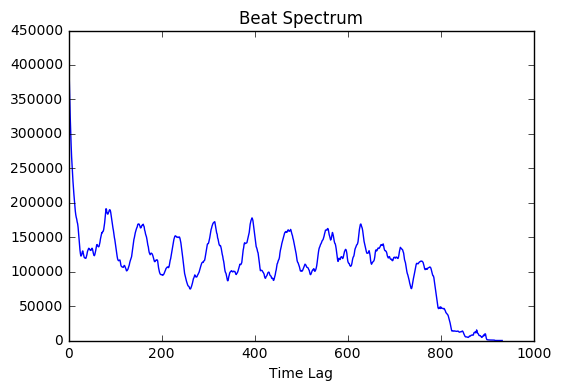

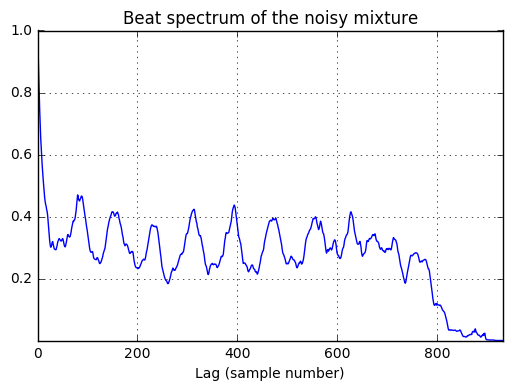

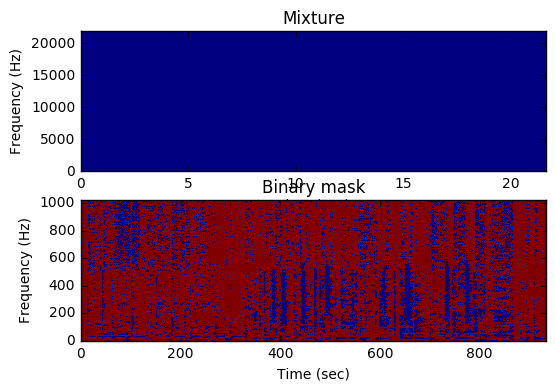

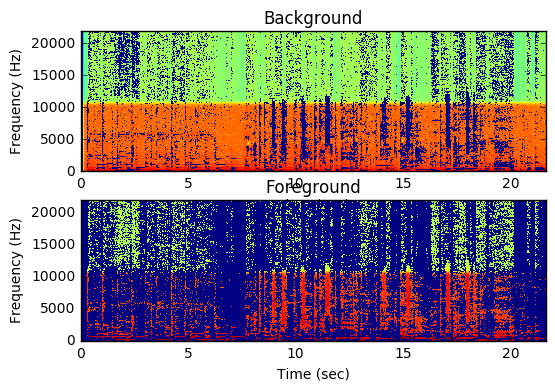

In [29]:
# "The Girl From Impanema": using my Repet (works poorly with REPET)
impanema_bg, impanema_fg = repet('girl_from_impanema.wav', 100, .5)
Audio(impanema_fg, rate=44100)

In [24]:
import nussl

# "Coastin": using nussl (works well with REPET)
coastin = nussl.AudioSignal(path_to_input_file='coastin.wav', sample_rate=22050)
coastin.to_mono()
rpt = nussl.Repet(coastin)
rpt.run()
bg_coastin, fg_coastin = rpt.make_audio_signals()
Audio(bg_coastin.audio_data, rate=22050)

In [21]:
# "The Girl From Impanema": using nussl (works poorly with REPET)
impanema = nussl.AudioSignal(path_to_input_file='girl_from_impanema.wav', sample_rate=22050)
impanema.to_mono()
rpt = nussl.Repet(impanema)
rpt.run()
bg_impanema, fg_impanema = rpt.make_audio_signals()
Audio(fg_impanema.audio_data, rate=22050)

#### 13. (1 point) Read the paper on REPET-SIM, which generalizes the approach used by REPET for audio source separation. The paper can be found [here](http://music.eecs.northwestern.edu/publications/Rafii-Pardo%20-%20Online%20REPET-SIM%20for%20Real-time%20Speech%20Enhancement%20-%20ICASSP%202013.pdf). Do you expect better or worse performance  on the audio you found for question 12, compared to REPET? Why? 

REPET-SIM assumes that the background, or music accompaniment -- is dense and low-ranked -- and that the foreground -- or the singing voice, is sparse and varied.  For signals where the recording very clearly distinguishes between the musical background and the vocal foreground, and when the vocal part itself is more sparse, REPET-SIM might be more useful. Since the song I picked, "Coastin'", contains a more sparse vocal part, and since the background repeating rhytmic is more dense, I believe REPET-SIM will be able to perform a slightly better separation than REPET.

#### 14. (1 point) Now, apply the NUSSL implementation of REPET-SIM to your selected mixture and compare the results to those of REPET.  Explain whether the new results confirm your hypothesis or reject it. 

After testing REPET-SIM on "Coastin'", I found that it didn't produce as big of an improvement as I had predicted. I believe the cause of this is because the repeating background rhythm in the signal is not as dense and low-ranked for it to benefit a substantial amount from REPET-SIM over plain REPET. Additionally, REPET-SIM produces a similarity matrix based on its assumptions about the signal's foreground and background. Since these assumptions cannot be as strongly applied to this song, it makes sense that REPET-SIM does not work as well on this signal. As a result, this test does not completely confirm my hypothesis. 

In [25]:
# your code goes here
signal = nussl.AudioSignal(path_to_input_file='coastin.wav')
repet_sim = nussl.RepetSim(signal)
repet_sim.run()

# Get audio signals
background_sim, foreground_sim = repet_sim.make_audio_signals()

Audio(background_sim.audio_data, rate=22050)